In [2]:
from __future__ import print_function, unicode_literals, absolute_import, division
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import os
import glob

from tifffile import imread
from csbdeep.utils import Path, download_and_extract_zip_file, plot_some
from csbdeep.io import save_tiff_imagej_compatible
from csbdeep.models import CARE

Using TensorFlow backend.


In [3]:
basedirGT = '/data/u934/service_imagerie/v_kapoor/PairTestData/GT/'
basedirLow = '/data/u934/service_imagerie/v_kapoor/PairTestData/Low/'
basedirResults = '/data/u934/service_imagerie/v_kapoor/PairTestData/results/'

Filename =  /data/u934/service_imagerie/v_kapoor/PairTestData/Low/40x_bin1_05_5min_2_w2CSU-488_s1_t28.tif
Filename =  /data/u934/service_imagerie/v_kapoor/PairTestData/Low/40x_bin1_05_5min_2_w2CSU-488_s1_t27.tif
Filename =  /data/u934/service_imagerie/v_kapoor/PairTestData/Low/40x_bin1_05_5min_2_w2CSU-488_s1_t29.tif
total Low images =  3
total GT images =  3
image size = (26, 2048, 2048)
image axes = ZYX


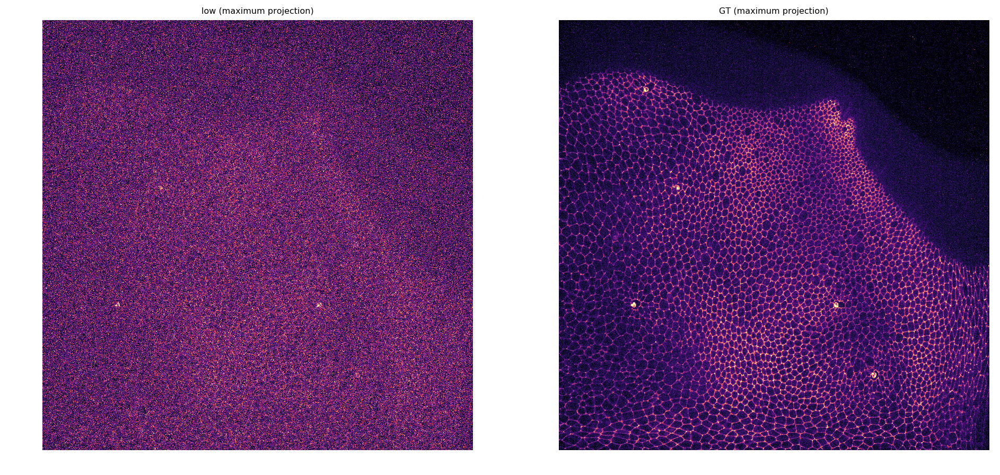

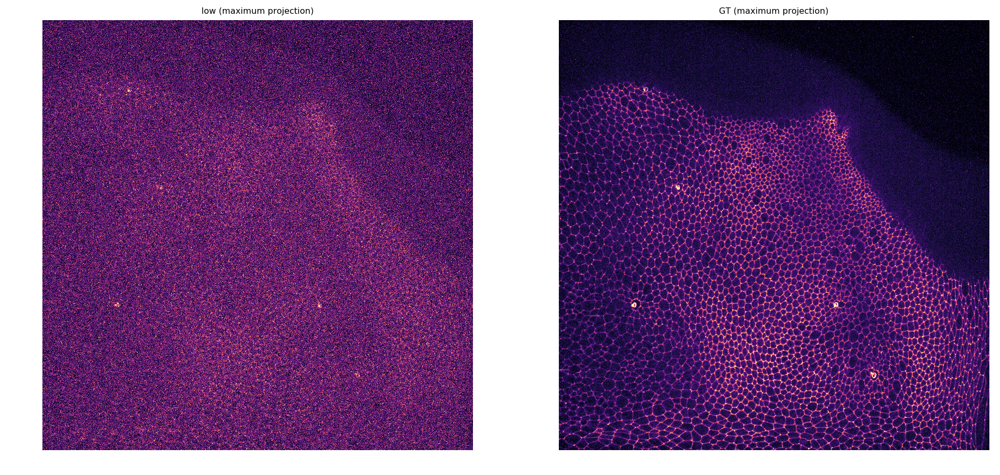

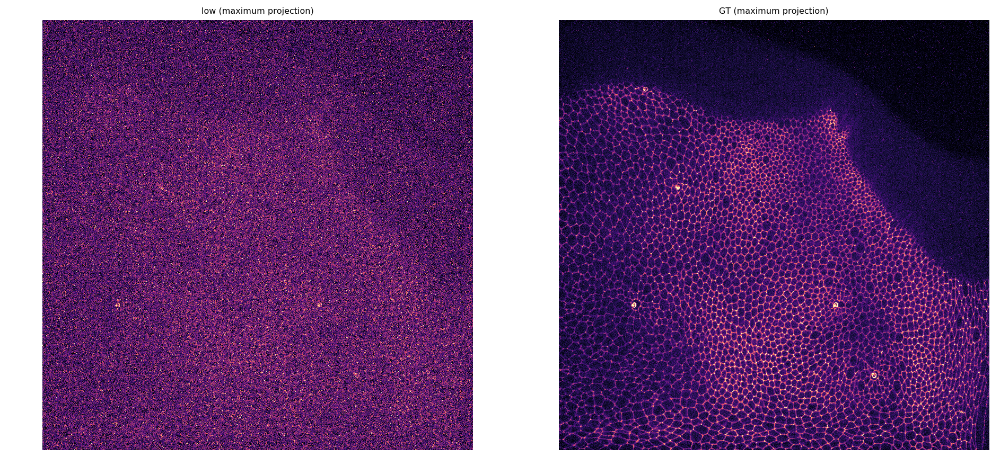

In [4]:

GT_path = os.path.join(basedirGT, '*tif')
GTfiles = []
Names = []
filesGT = glob.glob(GT_path)
for fname in filesGT:
      y = imread(fname)
    
      GTfiles.append(y)
    

    
    
Raw_path = os.path.join(basedirLow, '*tif')
Rawfiles = []
filesRaw = glob.glob(Raw_path)
for fname in filesRaw:
        x = imread(fname)
        Names.append(fname)
        print('Filename = ', fname)
        Rawfiles.append(x)
       
GTfiles.sort
Rawfiles.sort
Names.sort
axes = 'ZYX'
print('total Low images = ', len(Rawfiles))
print('total GT images = ', len(GTfiles))
print('image size =', x.shape)
print('image axes =', axes)
assert(len(Rawfiles) == len(GTfiles))
for i in range(0, len(Rawfiles)):
     plt.figure(figsize=(16,10))
      
     plot_some(np.stack([Rawfiles[i],GTfiles[i]]),
          title_list=[['low (maximum projection)','GT (maximum projection)']], 
          pmin=2,pmax=99.8);
         

In [5]:
model = CARE(config=None, name='DenoisingS1S2_model', basedir='models')

Loading network weights from 'weights_best.h5'.


In [6]:
%%time

Restoredfiles = []
for x in Rawfiles:
     restored = model.predict(x, axes)
     Restoredfiles.append(restored)

Out of memory, retrying with n_tiles = 4
Out of memory, retrying with n_tiles = 8
Out of memory, retrying with n_tiles = 16
Out of memory, retrying with n_tiles = 4
Out of memory, retrying with n_tiles = 8
Out of memory, retrying with n_tiles = 16
Out of memory, retrying with n_tiles = 4
Out of memory, retrying with n_tiles = 8
Out of memory, retrying with n_tiles = 16
CPU times: user 3min 29s, sys: 1min 53s, total: 5min 22s
Wall time: 6min 16s


In [7]:
Path(basedirResults).mkdir(exist_ok=True)
for i in range(0, len(Names)):
     print((basedirResults + '%s_' + os.path.basename(Names[i]) ))
     save_tiff_imagej_compatible((basedirResults + '%s_' + os.path.basename(Names[i]) ) % model.name, Restoredfiles[i], axes)

/data/u934/service_imagerie/v_kapoor/PairTestData/results/%s_40x_bin1_05_5min_2_w2CSU-488_s1_t28.tif
/data/u934/service_imagerie/v_kapoor/PairTestData/results/%s_40x_bin1_05_5min_2_w2CSU-488_s1_t27.tif
/data/u934/service_imagerie/v_kapoor/PairTestData/results/%s_40x_bin1_05_5min_2_w2CSU-488_s1_t29.tif


Filename =  /data/u934/service_imagerie/v_kapoor/PairTestData/Low/40x_bin1_05_5min_2_w2CSU-488_s1_t28.tif
Filename =  /data/u934/service_imagerie/v_kapoor/PairTestData/Low/40x_bin1_05_5min_2_w2CSU-488_s1_t27.tif
Filename =  /data/u934/service_imagerie/v_kapoor/PairTestData/Low/40x_bin1_05_5min_2_w2CSU-488_s1_t29.tif


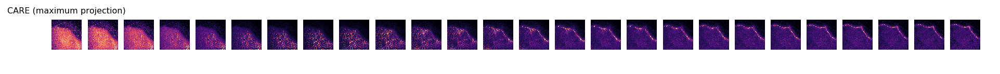

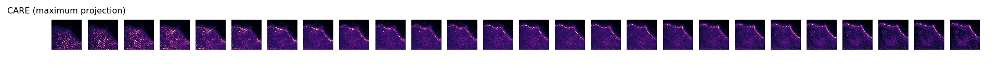

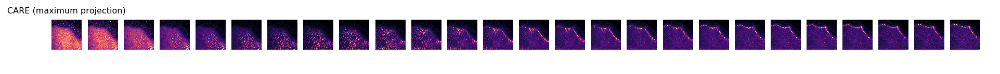

In [8]:
for i in range(0, len(Restoredfiles)):
      plt.figure(figsize=(16,10))
      plot_some(np.stack([Restoredfiles[i]]),
          title_list=[['CARE (maximum projection)']], 
          pmin=2,pmax=99.8);
      print('Filename = ', Names[i])
